In [ ]:
!pip install pm4py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 20.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26099 sha256=3e33a90062af7d255fe781b62308f693d7d80123843544e37e3df94716800c1a
  Stored in directory: /root/.cache/pip/wheels/fa/80/8c/43488a924a046b733b64de3fac99252674c892a4c3801c0a61
  Created wheel for stringdist: filename=StringDist-1.0.9-cp310-cp310-linux_x86_64.whl size=24958 sha256=66c19b674b63a33d6bcedf023dbc3bbae4b855a4b1f2fe0e8129ed282a32191e
  Stored in directory: /root/.cache/pip/wheels/79/25/0a/4a0c2c7af31a8b473f6e10e30312396f31ae899722600d7b99
Successfully built intervaltree stringdist


In [ ]:
# import all libraries
import pm4py
import tempfile

from google.colab import drive
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from IPython.display import Image



In [ ]:
# import all libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.stats import pareto

In [ ]:
# mounted at /content/drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import the XES file
xes_file = 'BPI_Challenge_2019.xes'
file_path = f'/content/drive/MyDrive/BPI/{xes_file}'

In [ ]:
log = xes_importer.apply(file_path)

/usr/local/lib/python3.10/dist-packages/pm4py/util/dt_parsing/parser.py:76: UserWarning:

ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11



parsing log, completed traces ::   0%|          | 0/251734 [00:00<?, ?it/s]

In [ ]:
# convert the xes files to csv files
from pm4py.objects.conversion.log import converter as xes_converter
from pm4py.objects.log.importer.xes import importer as xes_importer

pd = xes_converter.apply(log, variant=xes_converter.Variants.TO_DATA_FRAME)

In [ ]:
len(log)
log_dataframe = pm4py.convert_to_dataframe(log)

/usr/local/lib/python3.10/dist-packages/pm4py/utils.py:486: UserWarning:

the EventLog class has been deprecated and will be removed in a future release.



In [ ]:
print(log_dataframe[:10])

       User org:resource                         concept:name  \
0  batch_00     batch_00                         SRM: Created   
1  batch_00     batch_00                        SRM: Complete   
2  batch_00     batch_00               SRM: Awaiting Approval   
3  batch_00     batch_00              SRM: Document Completed   
4  batch_00     batch_00  SRM: In Transfer to Execution Syst.   
5  batch_00     batch_00                         SRM: Ordered   
6  batch_00     batch_00          SRM: Change was Transmitted   
7  user_000     user_000           Create Purchase Order Item   
8      NONE         NONE               Vendor creates invoice   
9  user_000     user_000                 Record Goods Receipt   

   Cumulative net worth (EUR)            time:timestamp case:Spend area text  \
0                       298.0 2018-01-02 12:53:00+00:00         CAPEX & SOCS   
1                       298.0 2018-01-02 13:53:00+00:00         CAPEX & SOCS   
2                       298.0 2018-01-02 13:

In [ ]:
len(log_dataframe)

1595923

In [ ]:
# delete the duplicates
log_dataframe = log_dataframe.drop_duplicates()
len(log_dataframe)

1463175

In [ ]:
# creating the attribute key and attribute value
attribute_key = 'case:Item Category'
attribute_value = '2-way match'

# filtering the dataframe
filtered_df_2way = log_dataframe[log_dataframe[attribute_key] == attribute_value]

# print the filtered dataframe
filtered_df_2way[:10]

,User,org:resource,concept:name,Cumulative net worth (EUR),time:timestamp,case:Spend area text,case:Company,case:Document Type,case:Sub spend area text,case:Purchasing Document,...,case:Vendor,case:Item Type,case:Item Category,case:Spend classification text,case:Source,case:Name,case:GR-Based Inv. Verif.,case:Item,case:concept:name,case:Goods Receipt
1590025,NONE,NONE,Vendor creates invoice,198.0,2017-12-16 22:59:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00010,4507075964_00010,False
1590026,user_602,user_602,Create Purchase Order Item,198.0,2018-01-03 12:47:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00010,4507075964_00010,False
1590027,user_603,user_603,Change Approval for Purchase Order,198.0,2018-01-03 13:56:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00010,4507075964_00010,False
1590028,user_359,user_359,Record Invoice Receipt,198.0,2018-01-04 09:04:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00010,4507075964_00010,False
1590029,user_604,user_604,Clear Invoice,198.0,2018-01-10 11:35:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00010,4507075964_00010,False
1590030,user_602,user_602,Change Approval for Purchase Order,198.0,2018-04-06 08:38:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00010,4507075964_00010,False
1590031,user_603,user_603,Change Approval for Purchase Order,198.0,2018-04-06 13:58:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00010,4507075964_00010,False
1590032,user_603,user_603,Change Approval for Purchase Order,62.0,2018-01-03 13:56:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00020,4507075964_00020,False
1590033,NONE,NONE,Vendor creates invoice,62.0,2018-03-23 22:59:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00020,4507075964_00020,False
1590034,user_602,user_602,Change Approval for Purchase Order,62.0,2018-04-06 08:38:00+00:00,Others,companyID_0003,Framework order,Utilities,4507075964,...,vendorID_1686,Limit,2-way match,OTHER,sourceSystemID_0000,vendor_1610,False,00020,4507075964_00020,False


In [ ]:
len(filtered_df_2way)

5898

In [ ]:
# filtering on a timeframe for 2-way match
if __name__ == "__main__":
    filtered_timeframe_2way = pm4py.filter_time_range(filtered_df_2way, "2017-12-01 00:00:00", "2019-01-01 23:59:59")

In [ ]:
len(filtered_timeframe_2way)

4800

In [ ]:
pm4py.write_xes(filtered_df_2way, '/content/drive/MyDrive/BPI/filtered_dataframe_2way.xes')
pm4py.write_xes(filtered_timeframe_2way, '/content/drive/MyDrive/BPI/filtered_dataframe_timeframe_2way.xes')

exporting log, completed traces ::   0%|          | 0/1044 [00:00<?, ?it/s]

exporting log, completed traces ::   0%|          | 0/913 [00:00<?, ?it/s]

In [ ]:
print(filtered_timeframe_2way[:3])

             User org:resource                        concept:name  \
1590025      NONE         NONE              Vendor creates invoice   
1590026  user_602     user_602          Create Purchase Order Item   
1590027  user_603     user_603  Change Approval for Purchase Order   

         Cumulative net worth (EUR)            time:timestamp  \
1590025                       198.0 2017-12-16 22:59:00+00:00   
1590026                       198.0 2018-01-03 12:47:00+00:00   
1590027                       198.0 2018-01-03 13:56:00+00:00   

        case:Spend area text    case:Company case:Document Type  \
1590025               Others  companyID_0003    Framework order   
1590026               Others  companyID_0003    Framework order   
1590027               Others  companyID_0003    Framework order   

        case:Sub spend area text case:Purchasing Document  ...    case:Vendor  \
1590025                Utilities               4507075964  ...  vendorID_1686   
1590026                Util

In [ ]:
# import the dfg_discovery algorithm and dfg_visualization object
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization

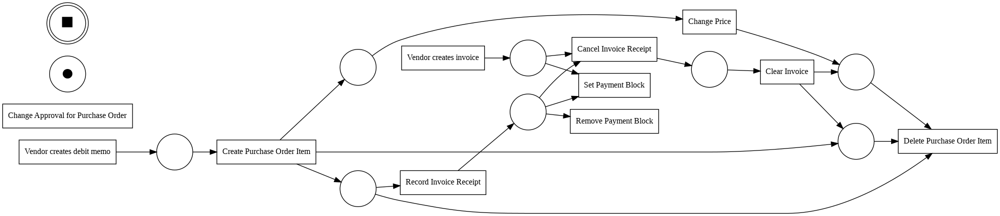

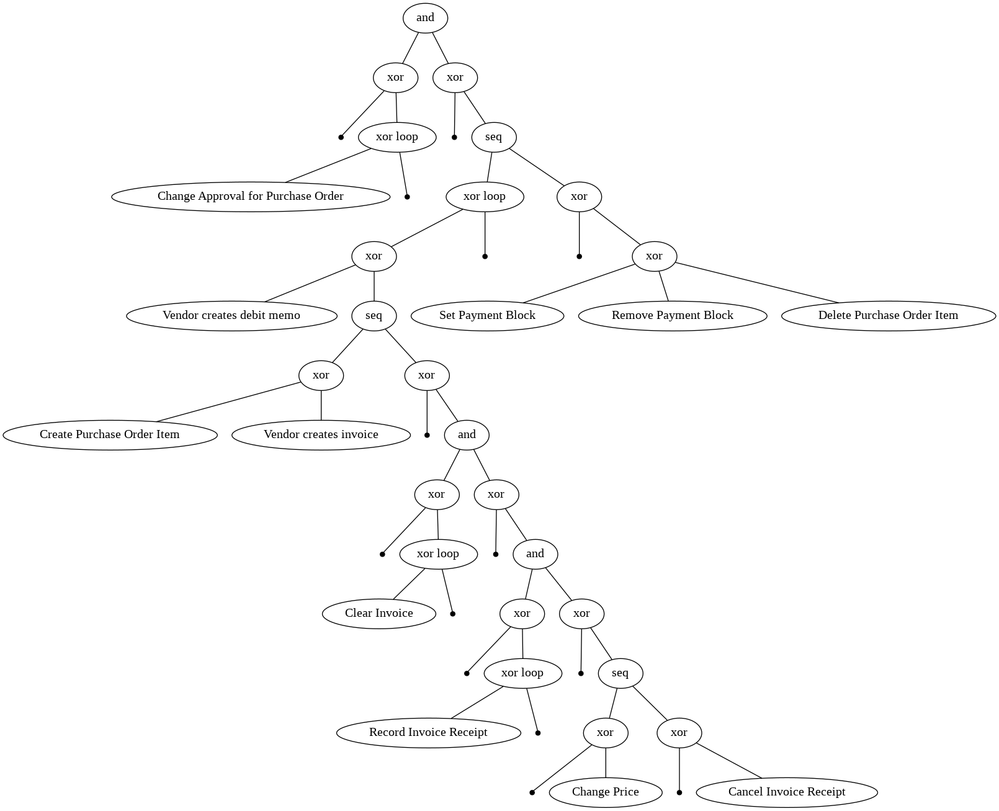

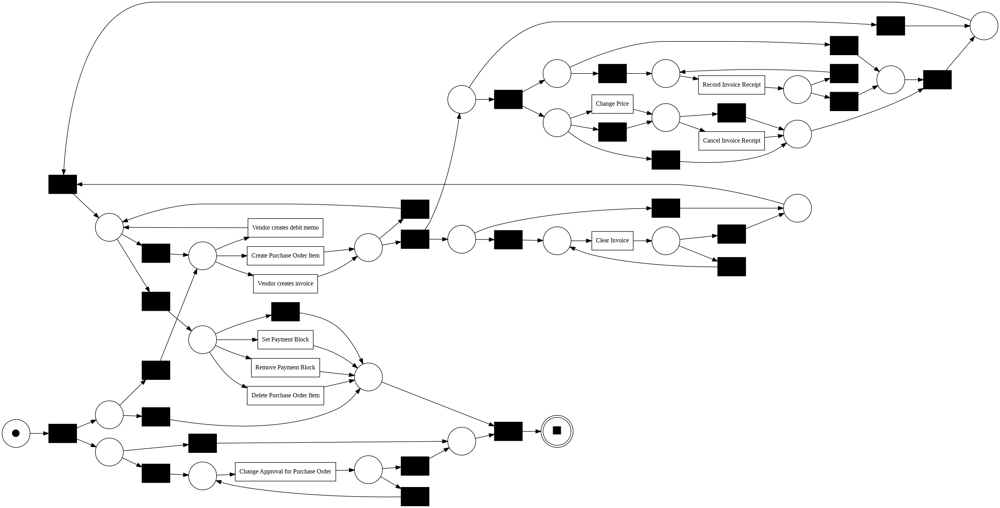

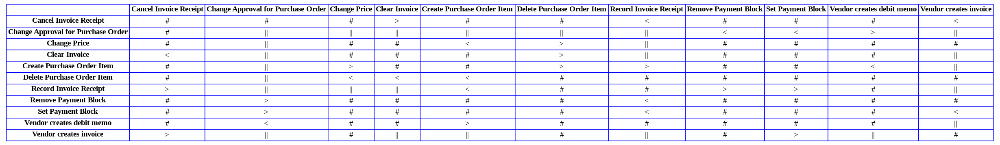

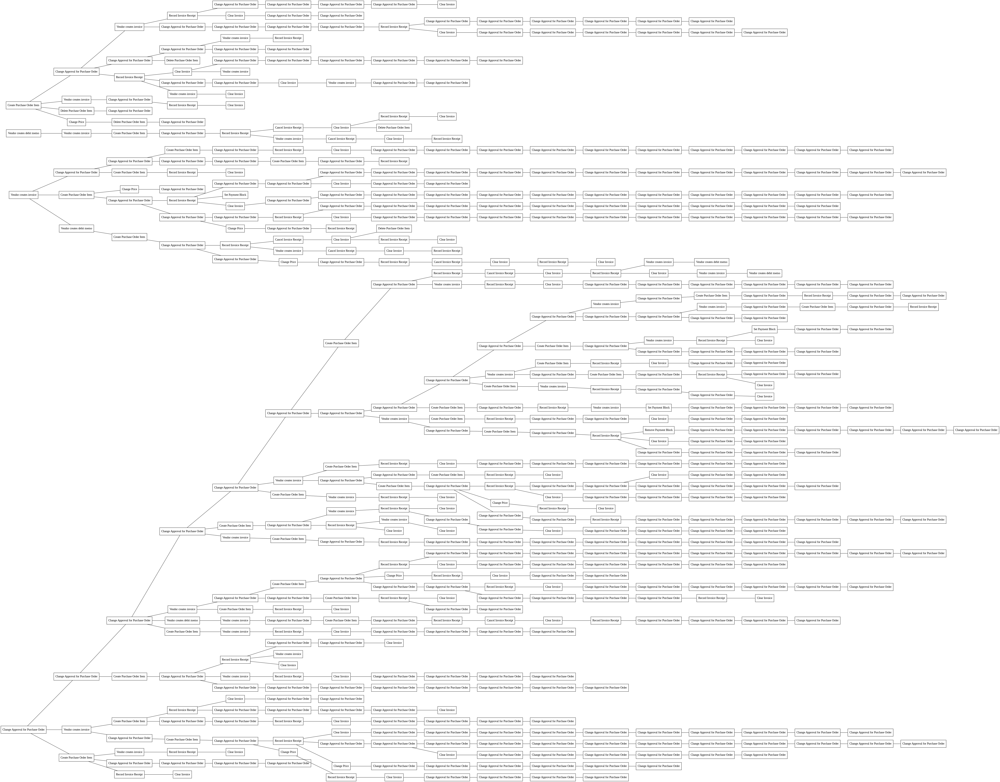

In [ ]:
# creating graph from filtered timeframe of 2 way match
graph_from_log = dfg_discovery.apply(filtered_timeframe_2way)

# Alpha_miner algorithm
net, im, fm = pm4py.discover_petri_net_alpha(filtered_timeframe_2way)

# visualise the Alpha_miner algorithm
pm4py.view_petri_net(net, im, fm, format='png')

# discover process tree using inductive miner
process_tree = pm4py.discover_process_tree_inductive(filtered_timeframe_2way)
pm4py.view_process_tree(process_tree, format='png')

# discover petri net using inductive miner
net, im, fm = pm4py.discover_petri_net_inductive(filtered_timeframe_2way)
pm4py.view_petri_net(net, im, fm, format='png')

footprints = pm4py.discover_footprints(filtered_timeframe_2way)
pm4py.view_footprints(footprints, format='png')

prefix_tree = pm4py.discover_prefix_tree(filtered_timeframe_2way)
pm4py.view_prefix_tree(prefix_tree, format='png')


In [ ]:
# import the alpha_miner algorithm and the petri net visualizer object
from pm4py.objects.petri_net.importer import importer as pnml_importer
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

In [ ]:
# import libraries
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator

replaying log with TBR, completed variants ::   0%|          | 0/149 [00:00<?, ?it/s]

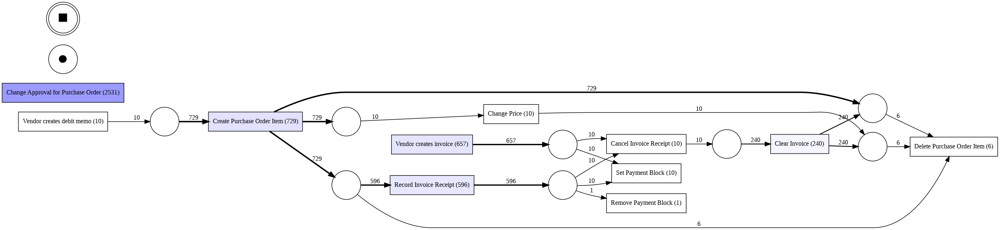

In [ ]:
# apply Alpha miner algorithm and vizualize
net, initial_marking, final_marking = alpha_miner.apply(filtered_timeframe_2way)
viz_2way_alpha = pn_visualizer.apply(net, initial_marking, final_marking, variant=pn_visualizer.Variants.FREQUENCY, parameters={alpha_miner.Variants.ALPHA_VERSION_PLUS.value.Parameters.REMOVE_UNCONNECTED:'0:0:0'}, log=filtered_timeframe_2way)
pn_visualizer.view(viz_2way_alpha)

In [ ]:
# fing the precision, simplicity, generalization and fitness for 2 way match
simplicity_filtered_timeframe_2way = simplicity_evaluator.apply(net)
generalization_filtered_timeframe_2way = generalization_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking)
fitness_filtered_timeframe_2way = replay_fitness_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
precision_filtered_timeframe_2way = precision_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

print(str(fitness_filtered_timeframe_2way))
print(str(precision_filtered_timeframe_2way))
print(str(generalization_filtered_timeframe_2way))
print(str(simplicity_filtered_timeframe_2way))

replaying log with TBR, completed variants ::   0%|          | 0/149 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/149 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/459 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0, 'average_trace_fitness': 0.1558488776040802, 'log_fitness': 0.1998165518480815, 'percentage_of_fitting_traces': 0.0}
0.886962478920742
0.7386728575295906
0.9130434782608695


In [ ]:
# import heuristic miner algorithm and heuristic_net visualizer
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer

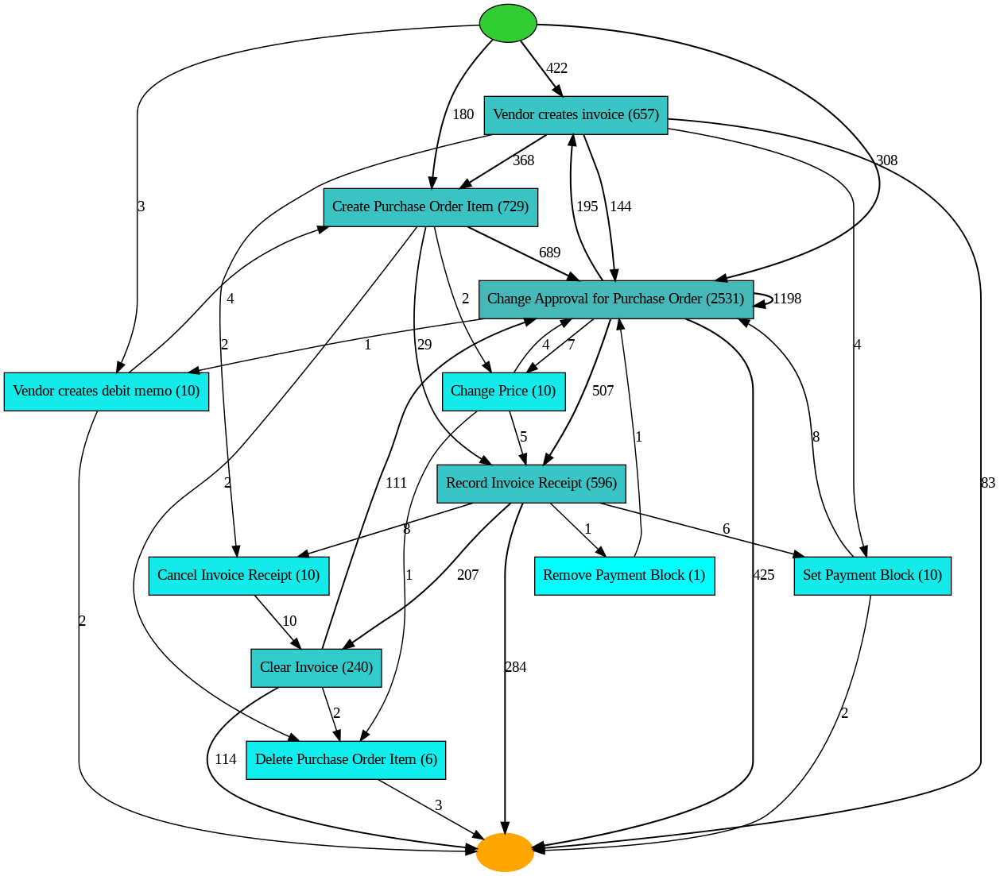

In [ ]:
net = heuristics_miner.apply_heu(filtered_timeframe_2way, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.8})
# apply heuristics miner and vizualize
heu_net = heuristics_miner.apply_heu(filtered_timeframe_2way)
viz_2way_heuristic = hn_visualizer.apply(heu_net)
hn_visualizer.view(viz_2way_heuristic)

In [ ]:
net, initial_marking, final_marking = heuristics_miner.apply(filtered_timeframe_2way, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.8})
# find the heuristic precision, simplicity, generalization and fitness for 2 way match
fitness_heuristic_timeframe_2way = replay_fitness_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
precision_heuristic_timeframe_2way = precision_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
generalization_heuristic_timeframe_2way = generalization_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking)
simplicity_heuristic_timeframe_2way = simplicity_evaluator.apply(net)

print(str(fitness_heuristic_timeframe_2way))
print(str(precision_heuristic_timeframe_2way))
print(str(generalization_heuristic_timeframe_2way))
print(str(simplicity_heuristic_timeframe_2way))

replaying log with TBR, completed variants ::   0%|          | 0/149 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/459 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/149 [00:00<?, ?it/s]

{'perc_fit_traces': 89.70427163198248, 'average_trace_fitness': 0.991718380176042, 'log_fitness': 0.9910343718922429, 'percentage_of_fitting_traces': 89.70427163198248}
0.734839989648926
0.8286582441182518
0.5476190476190476


In [ ]:
# import inductive algorithm libraries and process tree visualizer
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter

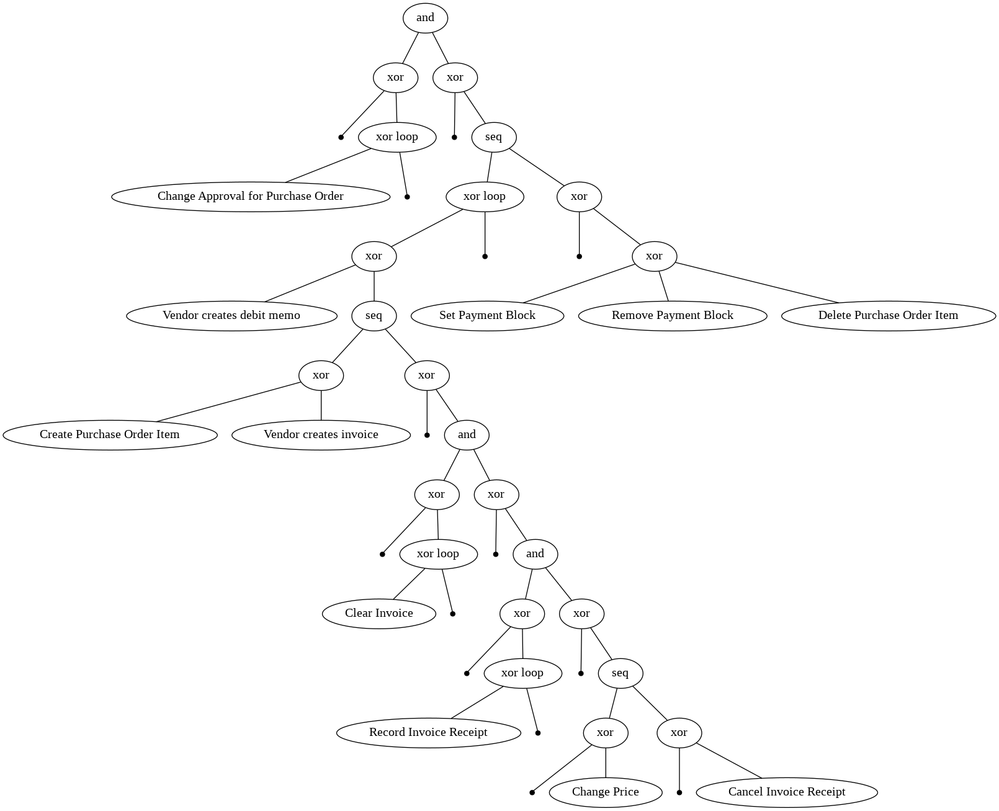

In [ ]:
# create the process tree and visualize
tree = inductive_miner.apply(filtered_timeframe_2way)
viz_2way_inductive = pt_visualizer.apply(tree)
pt_visualizer.view(viz_2way_inductive)

In [ ]:
net, initial_marking, final_marking = pt_converter.apply(tree)
# fing the unductive precision, simplicity, generalization and fitness for 2 way match
fitness_inductive_timeframe_2way = replay_fitness_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
precision_inductive_timeframe_2way = precision_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
generalization_inductive_timeframe_2way = generalization_evaluator.apply(filtered_timeframe_2way, net, initial_marking, final_marking)
simplicity_inductive_timeframe_2way = simplicity_evaluator.apply(net)

print(str(fitness_inductive_timeframe_2way))
print(str(precision_inductive_timeframe_2way))
print(str(generalization_filtered_timeframe_2way))
print(str(simplicity_inductive_timeframe_2way))

replaying log with TBR, completed variants ::   0%|          | 0/149 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/459 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/149 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}
0.4879906059851261
0.7386728575295906
0.6153846153846154


In [ ]:
# import the dfg_discovery algorithm and dfg visualization object
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization


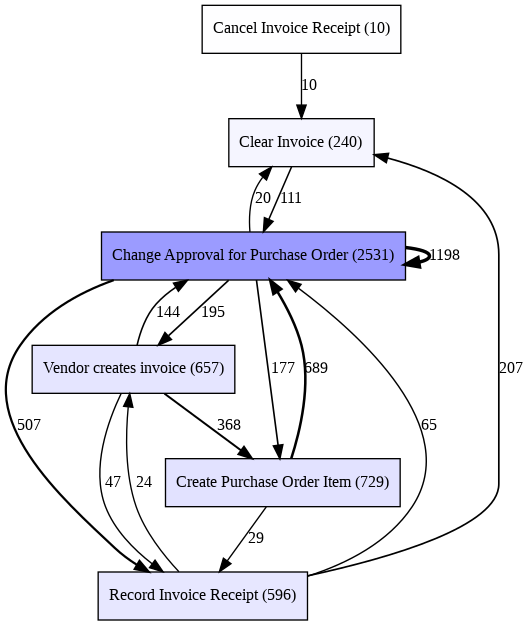

In [ ]:
# creating graph from 2 way matching and visualize
dfg = dfg_discovery.apply(filtered_timeframe_2way)
viz_2way_dfg = dfg_visualization.apply(dfg, log=filtered_timeframe_2way, variant=dfg_visualization.Variants.FREQUENCY, parameters={dfg_visualization.Variants.FREQUENCY.value.Parameters.MAX_NO_EDGES_IN_DIAGRAM:15})
dfg_visualization.view(viz_2way_dfg)

In [ ]:
# creating the attribute key and attribute value
attribute_key = 'case:Item Category'
attribute_value = '3-way match, invoice before GR'

# filtering the dataframe
filtered_df_3way_before = log_dataframe[log_dataframe[attribute_key] == attribute_value]

# print the filtered dataframe
filtered_df_3way_before[:10]

,User,org:resource,concept:name,Cumulative net worth (EUR),time:timestamp,case:Spend area text,case:Company,case:Document Type,case:Sub spend area text,case:Purchasing Document,...,case:Vendor,case:Item Type,case:Item Category,case:Spend classification text,case:Source,case:Name,case:GR-Based Inv. Verif.,case:Item,case:concept:name,case:Goods Receipt
0,batch_00,batch_00,SRM: Created,298.0,2018-01-02 12:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
1,batch_00,batch_00,SRM: Complete,298.0,2018-01-02 13:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
2,batch_00,batch_00,SRM: Awaiting Approval,298.0,2018-01-02 13:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
3,batch_00,batch_00,SRM: Document Completed,298.0,2018-01-02 13:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
4,batch_00,batch_00,SRM: In Transfer to Execution Syst.,298.0,2018-01-02 13:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
5,batch_00,batch_00,SRM: Ordered,298.0,2018-01-02 13:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
6,batch_00,batch_00,SRM: Change was Transmitted,298.0,2018-01-02 13:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
7,user_000,user_000,Create Purchase Order Item,298.0,2018-01-02 13:53:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
8,NONE,NONE,Vendor creates invoice,298.0,2018-01-02 22:59:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True
9,user_000,user_000,Record Goods Receipt,298.0,2018-03-06 06:44:00+00:00,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,...,vendorID_0000,Standard,"3-way match, invoice before GR",NPR,sourceSystemID_0000,vendor_0000,False,00001,2000000000_00001,True


In [ ]:
len(filtered_df_3way_before)

1231845

In [ ]:
pm4py.write_xes(filtered_df_3way_before, '/content/drive/MyDrive/BPI/filtered_dataframe_3way_before.xes')

exporting log, completed traces ::   0%|          | 0/221010 [00:00<?, ?it/s]

In [ ]:
# filtering on a timeframe for 2-way match
if __name__ == "__main__":
    filtered_timeframe_3way_before = pm4py.filter_time_range(filtered_df_3way_before, "2018-01-01 00:00:00", "2019-02-01 23:59:59")

In [ ]:
len(filtered_timeframe_3way_before)

1231631

In [ ]:
pm4py.write_xes(filtered_timeframe_3way_before, '/content/drive/MyDrive/BPI/filtered_timeframe_3way_before.xes')

exporting log, completed traces ::   0%|          | 0/221010 [00:00<?, ?it/s]

In [ ]:
print(filtered_timeframe_3way_before[:3])

       User org:resource            concept:name  Cumulative net worth (EUR)  \
0  batch_00     batch_00            SRM: Created                       298.0   
1  batch_00     batch_00           SRM: Complete                       298.0   
2  batch_00     batch_00  SRM: Awaiting Approval                       298.0   

             time:timestamp case:Spend area text    case:Company  \
0 2018-01-02 12:53:00+00:00         CAPEX & SOCS  companyID_0000   
1 2018-01-02 13:53:00+00:00         CAPEX & SOCS  companyID_0000   
2 2018-01-02 13:53:00+00:00         CAPEX & SOCS  companyID_0000   

  case:Document Type case:Sub spend area text case:Purchasing Document  ...  \
0  EC Purchase order      Facility Management               2000000000  ...   
1  EC Purchase order      Facility Management               2000000000  ...   
2  EC Purchase order      Facility Management               2000000000  ...   

     case:Vendor case:Item Type              case:Item Category  \
0  vendorID_0000      

In [ ]:
# creating graph from filtered timegrame of 3 way match invoice before GR
graph_from_log = dfg_discovery.apply(filtered_timeframe_3way_before)


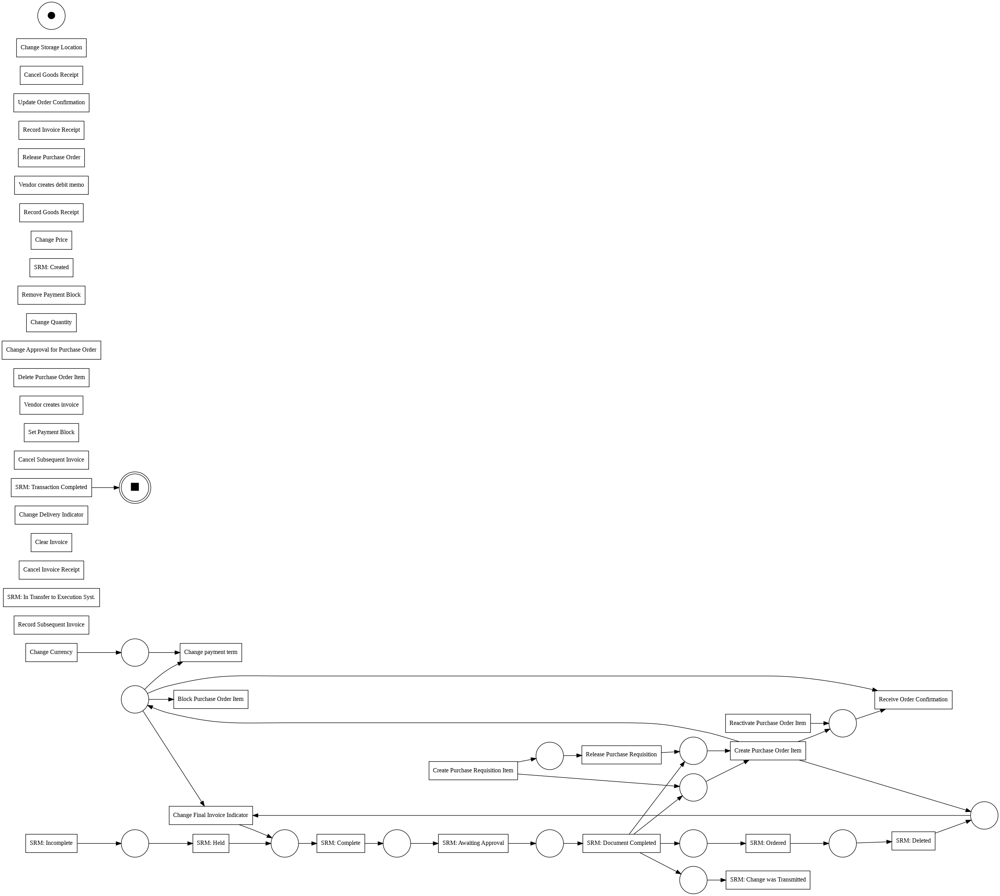

In [ ]:
# Alpha_miner algorithm
net, im, fm = pm4py.discover_petri_net_alpha(filtered_timeframe_3way_before)

# visualise the Alpha_miner algorithm
pm4py.view_petri_net(net, im, fm, format='png')

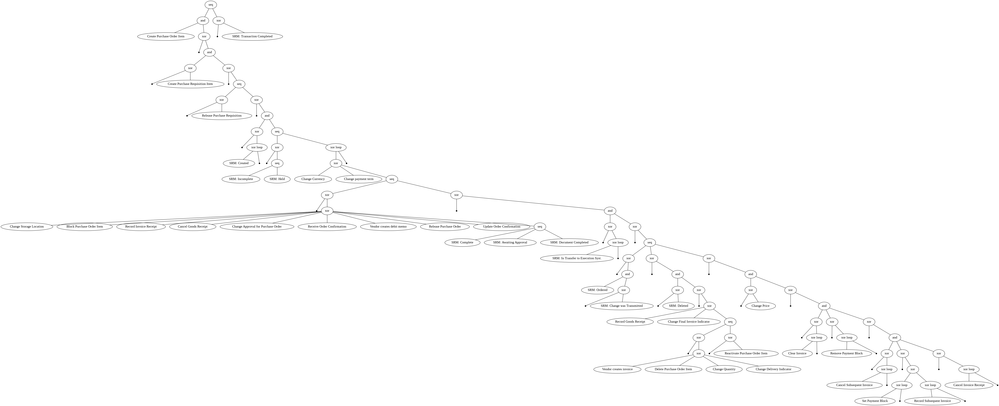

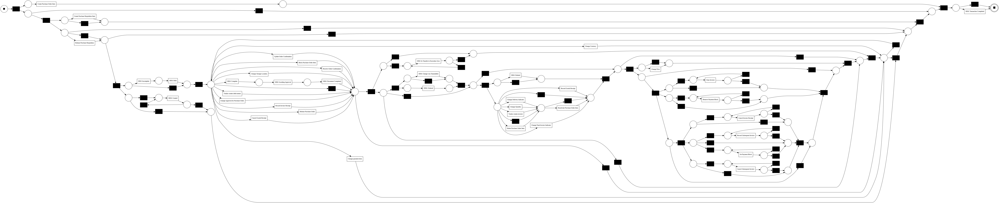

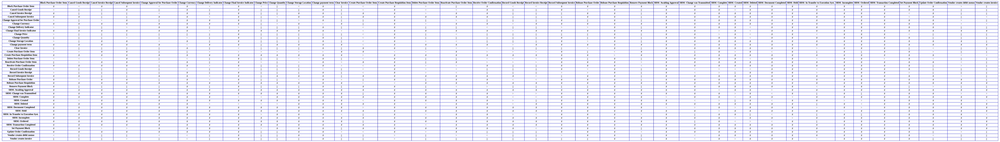

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0883153 to fit


In [ ]:
# discover process tree using inductive miner
process_tree = pm4py.discover_process_tree_inductive(filtered_timeframe_3way_before)
pm4py.view_process_tree(process_tree, format='png')

# discover petri net using inductive miner
net, im, fm = pm4py.discover_petri_net_inductive(filtered_timeframe_3way_before)
pm4py.view_petri_net(net, im, fm, format='png')

footprints = pm4py.discover_footprints(filtered_timeframe_3way_before)
pm4py.view_footprints(footprints, format='png')

prefix_tree = pm4py.discover_prefix_tree(filtered_timeframe_3way_before)
pm4py.view_prefix_tree(prefix_tree, format='png')


replaying log with TBR, completed variants ::   0%|          | 0/7725 [00:00<?, ?it/s]

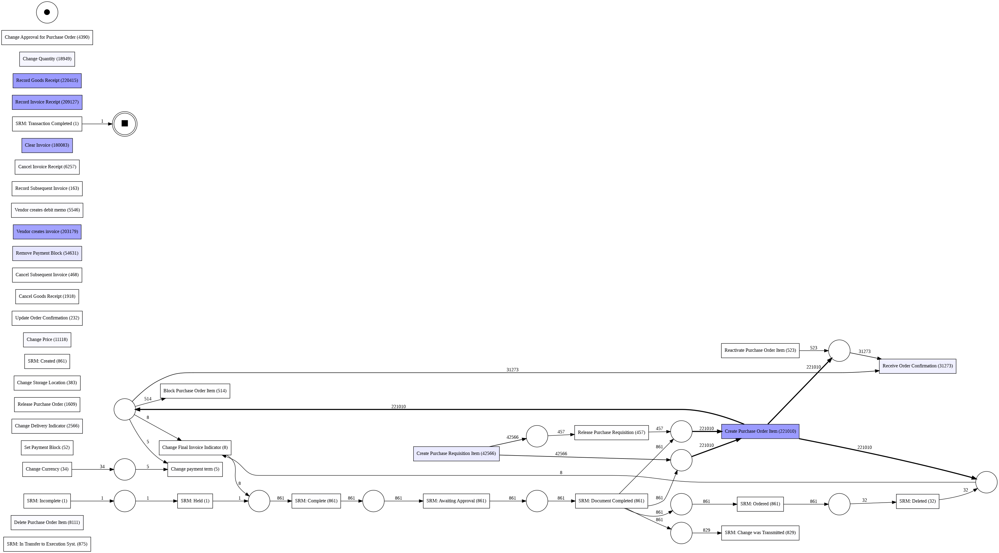

In [ ]:
# apply Alpha miner algorithm and vizualize for 3 way match invoice before GR
net, initial_marking, final_marking = alpha_miner.apply(filtered_timeframe_3way_before)
viz_3way_alpha_before = pn_visualizer.apply(net, initial_marking, final_marking, variant=pn_visualizer.Variants.FREQUENCY, parameters={alpha_miner.Variants.ALPHA_VERSION_PLUS.value.Parameters.REMOVE_UNCONNECTED:'0:0:0'}, log=filtered_timeframe_3way_before)
pn_visualizer.view(viz_3way_alpha_before)

In [ ]:
# fing the precision, simplicity, generalization and fitness for 3 way match invoice before GR
simplicity_filtered_timeframe_3way_before = simplicity_evaluator.apply(net)
generalization_filtered_timeframe_3way_before = generalization_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking)
fitness_filtered_timeframe_3way_before = replay_fitness_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
precision_filtered_timeframe_3way_before = precision_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)

print(str(fitness_filtered_timeframe_3way_before))
print(str(precision_filtered_timeframe_3way_before))
print(str(generalization_filtered_timeframe_3way_before))
print(str(simplicity_filtered_timeframe_3way_before))

replaying log with TBR, completed variants ::   0%|          | 0/7725 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/7725 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/25418 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0, 'average_trace_fitness': 0.10941933725273457, 'log_fitness': 0.13355739789394627, 'percentage_of_fitting_traces': 0.0}
0.26061365118882274
0.8701310802051143
1.0


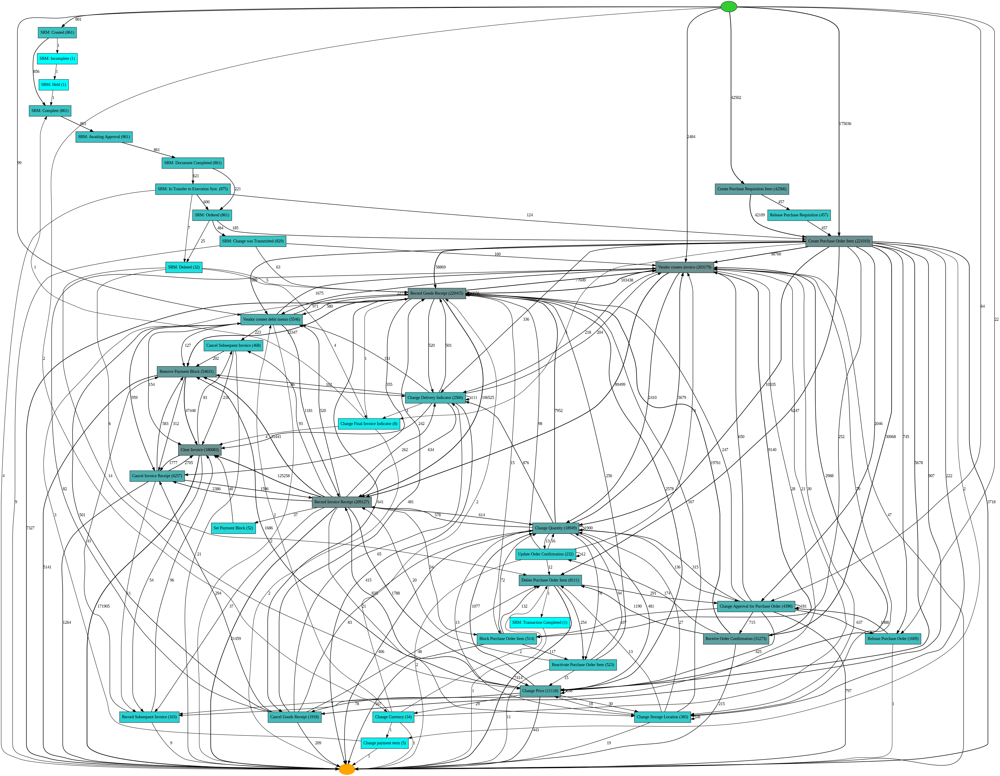

In [ ]:
# apply heuristics miner and vizualize
heu_net = heuristics_miner.apply_heu(filtered_timeframe_3way_before)
viz_3way_before_heuristic = hn_visualizer.apply(heu_net)
hn_visualizer.view(viz_3way_before_heuristic)

In [ ]:
net, initial_marking, final_marking = heuristics_miner.apply(filtered_timeframe_3way_before, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.8})
# fing the heuristic precision, simplicity, generalization and fitness for 3 way match invoice before GR
fitness_heuristic_timeframe_3way_before = replay_fitness_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
precision_heuristic_timeframe_3way_before = precision_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
generalization_heuristic_timeframe_3way_before = generalization_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking)
simplicity_heuristic_timeframe_3way_before = simplicity_evaluator.apply(net)

print(str(fitness_heuristic_timeframe_3way_before))
print(str(precision_heuristic_timeframe_3way_before))
print(str(generalization_heuristic_timeframe_3way_before))
print(str(simplicity_heuristic_timeframe_3way_before))

replaying log with TBR, completed variants ::   0%|          | 0/7725 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/25418 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/7725 [00:00<?, ?it/s]

{'perc_fit_traces': 2.1012623863173614, 'average_trace_fitness': 0.9009420075692122, 'log_fitness': 0.9024521580566062, 'percentage_of_fitting_traces': 2.1012623863173614}
0.9716787109731995
0.8443662075122863
0.4568288854003139


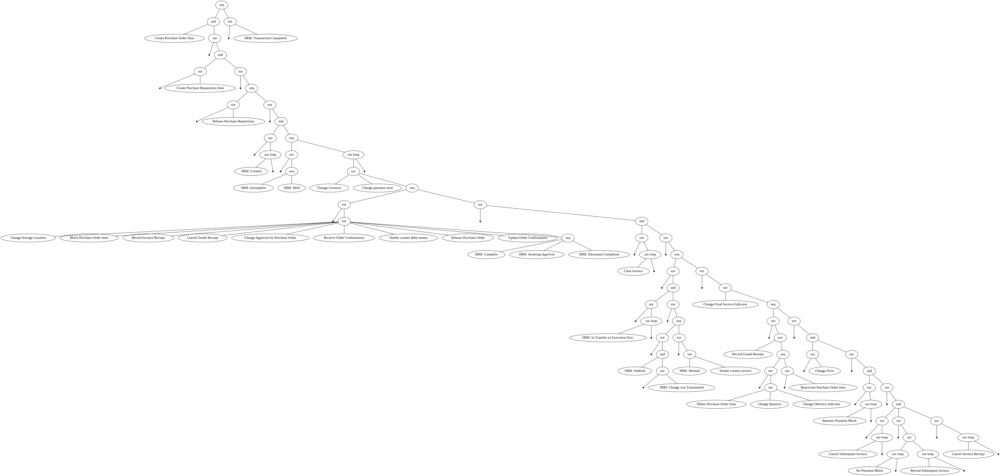

In [ ]:
# create the process tree and visualize
tree = inductive_miner.apply(filtered_timeframe_3way_before)
viz_3way_before_inductive = pt_visualizer.apply(tree)
pt_visualizer.view(viz_3way_before_inductive)

In [ ]:
net, initial_marking, final_marking = pt_converter.apply(tree)
# fing the unductive precision, simplicity, generalization and fitness for 3 way match invoice before GR
fitness_inductive_timeframe_3way_before = replay_fitness_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
precision_inductive_timeframe_3way_before = precision_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
generalization_inductive_timeframe_3way_before = generalization_evaluator.apply(filtered_timeframe_3way_before, net, initial_marking, final_marking)
simplicity_inductive_timeframe_3way_before = simplicity_evaluator.apply(net)

print(str(fitness_inductive_timeframe_3way_before))
print(str(precision_inductive_timeframe_3way_before))
print(str(generalization_inductive_timeframe_3way_before))
print(str(simplicity_inductive_timeframe_3way_before))

replaying log with TBR, completed variants ::   0%|          | 0/7725 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/25418 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/7725 [00:00<?, ?it/s]

{'perc_fit_traces': 99.60137550337089, 'average_trace_fitness': 0.9999246276368783, 'log_fitness': 0.9998908309388687, 'percentage_of_fitting_traces': 99.60137550337089}
0.27307566726435706
0.9202658569464365
0.5819935691318328


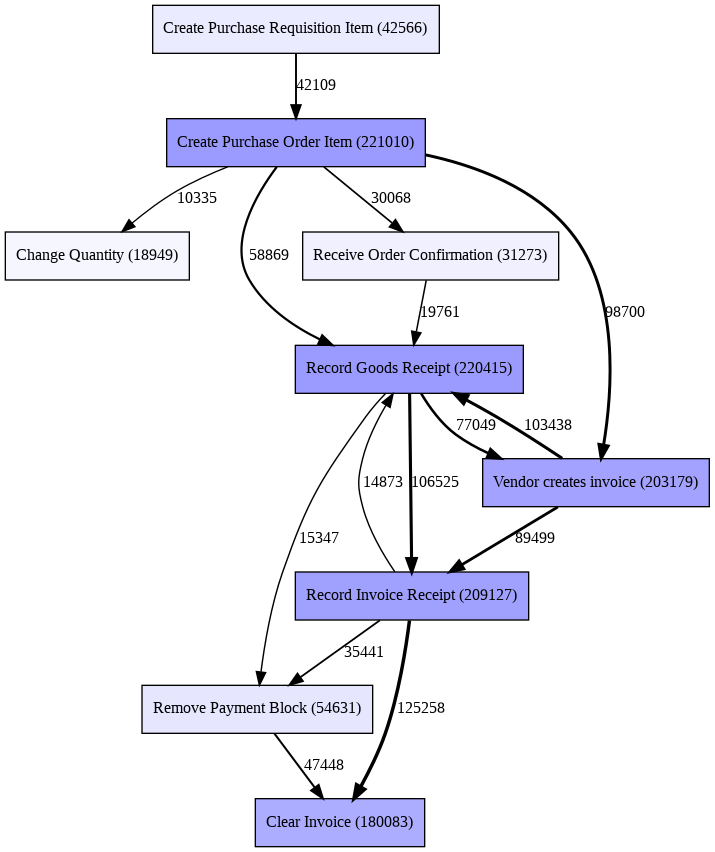

In [ ]:
# creating dfg graph from 3 way match invoice before GR and visualize
dfg = dfg_discovery.apply(filtered_timeframe_3way_before)
viz_3way_before_dfg = dfg_visualization.apply(dfg, log=filtered_timeframe_3way_before, variant=dfg_visualization.Variants.FREQUENCY, parameters={dfg_visualization.Variants.FREQUENCY.value.Parameters.MAX_NO_EDGES_IN_DIAGRAM:15})
dfg_visualization.view(viz_3way_before_dfg)

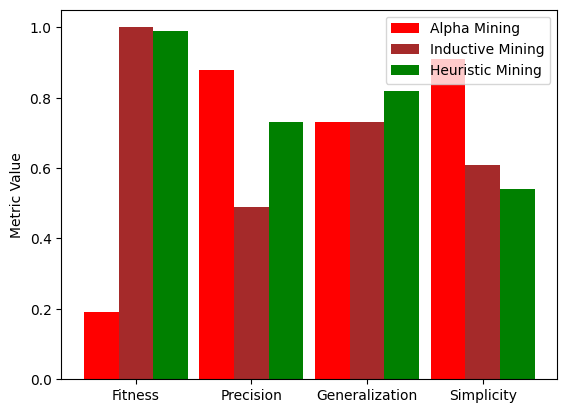

In [ ]:
import matplotlib.pyplot as plt

# define the metrics and their values
metrics = ['Fitness', 'Precision', 'Generalization', 'Simplicity']
alpha_mining = [0.19, 0.88, 0.73, 0.91]
inductive_mining = [1.0, 0.49, 0.73, 0.61]
heuristic_mining = [0.99, 0.73, 0.82, 0.54]

# set the positions of the bars
bar_positions = [1, 2, 3, 4]

# set the width of the bars
bar_width = 0.3

# create the bar chart
plt.bar(bar_positions, alpha_mining, color='red', width=bar_width, label='Alpha Mining')
plt.bar([p + bar_width for p in bar_positions], inductive_mining, color='brown', width=bar_width, label='Inductive Mining')
plt.bar([p + 2 * bar_width for p in bar_positions], heuristic_mining, color='green', width=bar_width, label='Heuristic Mining')

# Set the x-axis labels
plt.xticks([p + bar_width for p in bar_positions], metrics)

# Set the y-axis label
plt.ylabel('Metric Value')

# Add a legend
plt.legend()

# Show the plot
plt.show()


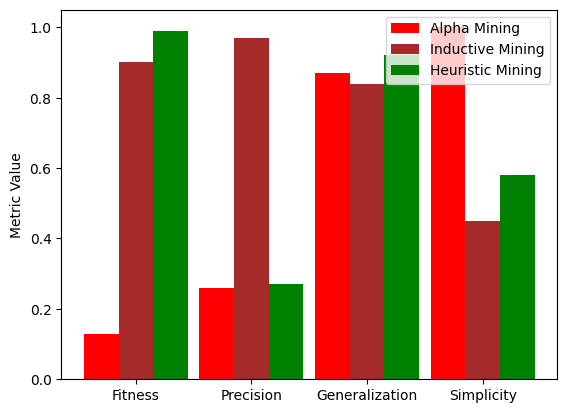

In [ ]:
import matplotlib.pyplot as plt

# define the metrics and their values
metrics = ['Fitness', 'Precision', 'Generalization', 'Simplicity']
alpha_mining = [0.13, 0.26, 0.87, 1.0]
inductive_mining = [0.90, 0.97, 0.84, 0.45]
heuristic_mining = [0.99, 0.27, 0.92, 0.58]

# set the positions of the bars
bar_positions = [1, 2, 3, 4]

# set the width of the bars
bar_width = 0.3

# create the bar chart
plt.bar(bar_positions, alpha_mining, color='red', width=bar_width, label='Alpha Mining')
plt.bar([p + bar_width for p in bar_positions], inductive_mining, color='brown', width=bar_width, label='Inductive Mining')
plt.bar([p + 2 * bar_width for p in bar_positions], heuristic_mining, color='green', width=bar_width, label='Heuristic Mining')

# Set the x-axis labels
plt.xticks([p + bar_width for p in bar_positions], metrics)

# Set the y-axis label
plt.ylabel('Metric Value')

# Add a legend
plt.legend()

# Show the plot
plt.show()


In [ ]:
import plotly.express as px
df = px.data.tips()
flg = px.histogram(filtered_timeframe_2way, x ="time:timestamp")
flg.show()


In [ ]:
import plotly.express as px
df = px.data.tips()
flg = px.histogram(filtered_timeframe_3way_before, x ="time:timestamp")
flg.show()